In [ ]:
## author: Anna Cherkinsky and Anushka Bangal

##Libraries
import os
import glob
import cv2
import numpy as np
import seaborn as sns
from tensorflow.keras import layers
from tensorflow.keras.applications import DenseNet121, VGG16
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import Callback, ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras import  Input

from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import metrics
import tensorflow as tf
from keras.layers import Dense, Flatten, Activation, Dropout, GlobalAveragePooling2D, BatchNormalization
from keras import optimizers, applications
#https://pyimagesearch.com/2019/06/03/fine-tuning-with-keras-and-deep-learning/


In [ ]:
! pip install kaggle #installing kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download xhlulu/140k-real-and-fake-faces

100% 3.75G/3.75G [00:25<00:00, 99.3MB/s]
100% 3.75G/3.75G [00:26<00:00, 155MB/s] 


In [ ]:
!unzip /content/140k-real-and-fake-faces.zip

Streaming output truncated to the last 5000 lines.
  inflating: real_vs_fake/real-vs-fake/valid/real/34832.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34836.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34839.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34847.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34848.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34852.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34861.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34864.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34868.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34877.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34883.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34887.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34891.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34894.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34904.jpg  
  inflating: real_v

In [ ]:
path  = '/content/real_vs_fake/real-vs-fake'

In [ ]:
#create a dataset for accessing images
dataset = {"image_path":[],"img_status":[],"where":[]}
for where in os.listdir(path):
    print(where)
    for status in os.listdir(path+"/"+where):
        print(status)
        for image in glob.glob(path+"/"+where+"/"+status+"/*.jpg"):
            dataset["image_path"].append(image)
            dataset["img_status"].append(status)
            dataset["where"].append(where)
dataset = pd.DataFrame(dataset)
dataset

train
fake
real
valid
fake
real
test
fake
real


,image_path,img_status,where
0,/content/real_vs_fake/real-vs-fake/train/fake/...,fake,train
1,/content/real_vs_fake/real-vs-fake/train/fake/...,fake,train
2,/content/real_vs_fake/real-vs-fake/train/fake/...,fake,train
3,/content/real_vs_fake/real-vs-fake/train/fake/...,fake,train
4,/content/real_vs_fake/real-vs-fake/train/fake/...,fake,train
...,...,...,...
139995,/content/real_vs_fake/real-vs-fake/test/real/2...,real,test
139996,/content/real_vs_fake/real-vs-fake/test/real/1...,real,test
139997,/content/real_vs_fake/real-vs-fake/test/real/6...,real,test
139998,/content/real_vs_fake/real-vs-fake/test/real/0...,real,test


In [ ]:
dataset.value_counts("img_status")

img_status
fake    70000
real    70000
dtype: int64

In [ ]:
real = dataset.value_counts("img_status")[1]
fake = dataset.value_counts("img_status")[0]

In [ ]:
import os

import cv2
import imutils as imutils
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf # machine learning
from tqdm import tqdm # make your loops show a smart progress meter 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sn

In [ ]:
#method for preprocessing using fft
from scipy.fftpack import fftn,fftshift
def fft(image):
  fft_img = np.abs(fftshift(fftn(image)))
  return fft_img

In [ ]:
#set number of batches and image generator
nbatch = 200
train_datagen = ImageDataGenerator()

In [ ]:
#load training data
training_set = train_datagen.flow_from_directory(path + '/train/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=True)

Found 100000 images belonging to 2 classes.


In [ ]:
#load test data no shuffle
test_set = train_datagen.flow_from_directory(path + '/test/',
                                            target_size=(224, 224),
                                            batch_size =nbatch,
                                            color_mode='rgb',
                                            class_mode = 'binary',
                                            shuffle=False)

Found 20000 images belonging to 2 classes.


In [ ]:
#load validation data no shuffle
val_set = train_datagen.flow_from_directory(path + '/valid/',
                                            target_size=(224, 224),
                                            batch_size =nbatch,
                                            color_mode='rgb',
                                            class_mode = 'binary',
                                           shuffle=False)

Found 20000 images belonging to 2 classes.


In [ ]:
#set VGG16 model
pre_trained = VGG16(
    include_top=False,
    weights="imagenet",
    #weights=None,
    input_tensor=None,
    input_shape=(224,224,3),
    pooling="max"
)

#since we are using imagenet, make it non trainable
pre_trained.trainable = False

#extract data
model = Sequential([pre_trained,
                    Flatten(),

                    Dense(1, activation = "sigmoid")])

#use SGD optimizer, which helps the accuracy
sgd = optimizers.SGD(lr = 1e-4, momentum = 0.9)#, nesterov = True)



model.compile(loss="binary_crossentropy", optimizer=sgd, metrics="accuracy")

model.summary()

58889256/58889256 [==============================] - 3s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 1)                 513       
                                                                 
Total params: 14,715,201
Trainable params: 513
Non-trainable params: 14,714,688
_________________________________________________________________


/usr/local/lib/python3.9/dist-packages/keras/optimizers/legacy/gradient_descent.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
from tensorflow.keras import optimizers
from tensorflow.keras import losses

epochs = 40

#call backs for checkpoint and early stopping
callbacks = [
             ModelCheckpoint('VGG.h5', monitor='val_loss', save_best_only=True), 
             EarlyStopping(monitor="val_loss", min_delta=0.001, patience=10)
]

history = model.fit(training_set, epochs=epochs, callbacks=callbacks, validation_data=val_set)

Epoch 1/40
500/500 [==============================] - 594s 1s/step - loss: 3.1756 - accuracy: 0.7011 - val_loss: 1.6074 - val_accuracy: 0.6959
Epoch 2/40
500/500 [==============================] - 554s 1s/step - loss: 1.6435 - accuracy: 0.7139 - val_loss: 1.9124 - val_accuracy: 0.6942
Epoch 3/40
500/500 [==============================] - 554s 1s/step - loss: 1.6029 - accuracy: 0.7103 - val_loss: 1.1439 - val_accuracy: 0.7638
Epoch 4/40
500/500 [==============================] - 554s 1s/step - loss: 1.7154 - accuracy: 0.7124 - val_loss: 1.1617 - val_accuracy: 0.7548
Epoch 5/40
500/500 [==============================] - 554s 1s/step - loss: 1.6080 - accuracy: 0.7144 - val_loss: 1.3542 - val_accuracy: 0.7314
Epoch 6/40
500/500 [==============================] - 554s 1s/step - loss: 1.4898 - accuracy: 0.7143 - val_loss: 0.8787 - val_accuracy: 0.7640
Epoch 7/40
500/500 [==============================] - 555s 1s/step - loss: 1.7665 - accuracy: 0.7105 - val_loss: 1.3514 - val_accuracy: 0.7056

In [ ]:
model.save('Real VS Fake VGG.h5')

In [ ]:
losses = pd.DataFrame(model.history.history)

<Axes: >

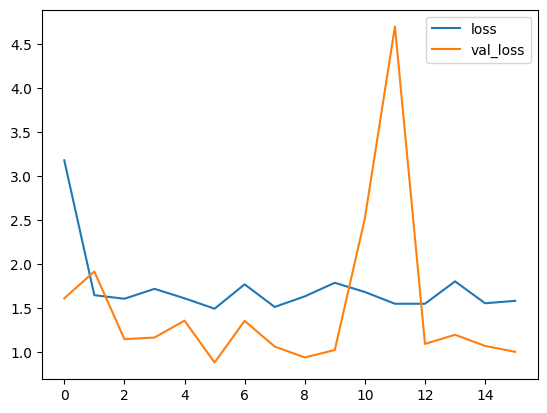

In [ ]:
losses[['loss','val_loss']].plot() #graph loss

<Axes: >

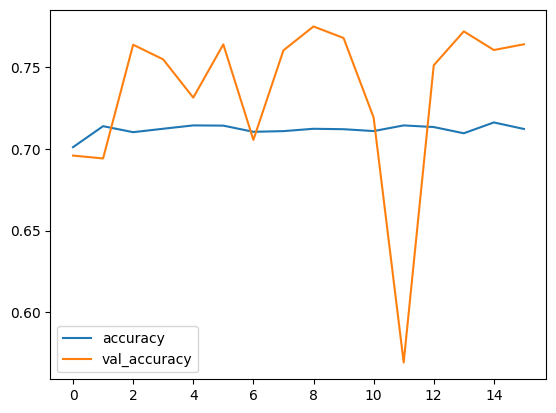

In [ ]:
losses[['accuracy','val_accuracy']].plot() #graph accuracy

In [ ]:
y_pred = model.predict(test_set)
y_test = test_set.classes

100/100 [==============================] - 94s 943ms/step


In [ ]:
np.shape(y_pred)

(20000, 1)

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
#Obtain metrics

In [ ]:
print("ROC-AUC Score:", metrics.roc_auc_score(y_test, y_pred))
print("AP Score:", metrics.average_precision_score(y_test, y_pred))

ROC-AUC Score: 0.847930195
AP Score: 0.8435543043346165


In [ ]:
print(metrics.classification_report(y_test, y_pred > 0.5))

              precision    recall  f1-score   support

           0       0.80      0.70      0.75     10000
           1       0.73      0.83      0.78     10000

    accuracy                           0.76     20000
   macro avg       0.77      0.76      0.76     20000
weighted avg       0.77      0.76      0.76     20000



In [ ]:
#Now, for the ImageGenerator, we input FFT as a freprocessing function
nbatch = 200
train_datagen2 = ImageDataGenerator(preprocessing_function=fft)

In [ ]:
#Set up the model
pre_trained2 = VGG16(
    include_top=False,
    weights='imagenet',
    input_tensor=None,
    input_shape=(224,224,3),
    pooling="max"
)

pre_trained2.trainable = False


#add layers to extract output
model2 = Sequential([pre_trained2,
                    Flatten(),
                    
                    Dense(512, activation = "relu"),
                   
                    
                    Dense(1, activation = "sigmoid")])

#Optimizer
sgd = optimizers.SGD(learning_rate = 1e-4,  momentum = 0.9)



model2.compile(loss="binary_crossentropy", optimizer=sgd, metrics="accuracy")

model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 flatten_1 (Flatten)         (None, 512)               0         
                                                                 
 batch_normalization_1 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 dense_1 (Dense)             (None, 1)                 513       
                                                                 
Total params: 14,717,249
Trainable params: 14,716,225
Non-trainable params: 1,024
_________________________________________________________________


In [ ]:
training_set = train_datagen2.flow_from_directory(path + '/train/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=True)

Found 100000 images belonging to 2 classes.


In [ ]:
test_set = train_datagen2.flow_from_directory(path + '/test/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=False)

Found 20000 images belonging to 2 classes.


In [ ]:
val_set = train_datagen2.flow_from_directory(path + '/valid/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=False)

Found 20000 images belonging to 2 classes.


In [ ]:
#run the model for FFT
epochs = 10


callbacks = [
             ModelCheckpoint('VGG2.h5', monitor='val_loss', save_best_only=True), 
             EarlyStopping(monitor="val_loss", min_delta=0.001, patience=10)
]


history2 = model2.fit(training_set, epochs=epochs, callbacks=callbacks, validation_data=val_set)

In [ ]:
model2.save('Real VS Fake VGG FTT.h5')

In [ ]:
losses = pd.DataFrame(model2.history.history)

<Axes: >

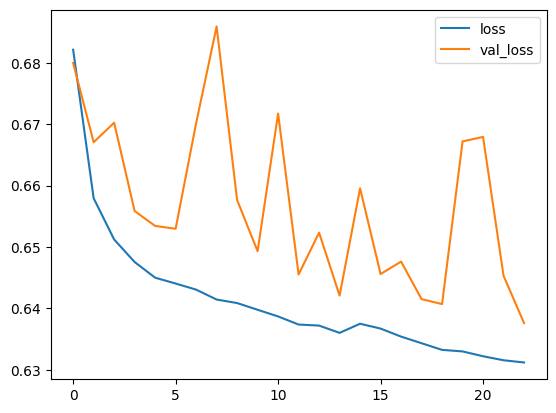

In [ ]:
losses[['loss','val_loss']].plot() #loss plot, very noizy

<Axes: >

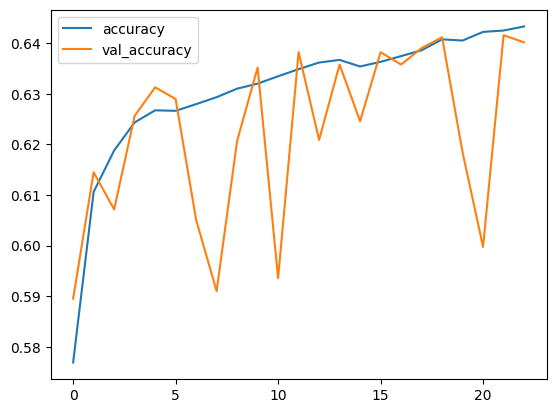

In [ ]:
losses[['accuracy','val_accuracy']].plot() #accuracy plot, very noizy

In [ ]:
#running test prediction
y_pred = model2.predict(test_set)
y_test = test_set.classes

100/100 [==============================] - 183s 2s/step


In [ ]:
#get metrics
print("ROC-AUC Score:", metrics.roc_auc_score(y_test, y_pred))
print("AP Score:", metrics.average_precision_score(y_test, y_pred))

ROC-AUC Score: 0.7010399549999999
AP Score: 0.6895785877210703


In [ ]:
print(metrics.classification_report(y_test, y_pred > 0.5))

              precision    recall  f1-score   support

           0       0.62      0.74      0.67     10000
           1       0.67      0.54      0.60     10000

    accuracy                           0.64     20000
   macro avg       0.65      0.64      0.64     20000
weighted avg       0.65      0.64      0.64     20000



In [ ]:
#general VGG16 summary
pre_trained2 = VGG16(
    include_top=False,
    #weights="imagenet",
    weights='imagenet',
    input_tensor=None,
    input_shape=(224,224,3),
    pooling="max"
)

pre_trained2.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
#Running the RGB model with batch normalization
pre_trained3 = VGG16(
    include_top=False,
    weights='imagenet',
    input_tensor=None,
    input_shape=(224,224,3),
    pooling="max"
)


for layer in pre_trained2.layers[:10]:
   layer.trainable = False
for layer in pre_trained2.layers[10:]:
   layer.trainable = True

model3 = Sequential([pre_trained3,
                    Flatten(),
                    
                    BatchNormalization(),
                    
                    Dense(1, activation = "sigmoid")])


sgd = optimizers.SGD(learning_rate = 1e-4,  momentum = 0.9)



model3.compile(loss="binary_crossentropy", optimizer=sgd, metrics="accuracy")

model3.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 flatten_4 (Flatten)         (None, 512)               0         
                                                                 
 batch_normalization_3 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 dense_7 (Dense)             (None, 1)                 513       
                                                                 
Total params: 14,717,249
Trainable params: 14,716,225
Non-trainable params: 1,024
_________________________________________________________________


In [ ]:
nbatch = 200
train_datagen = ImageDataGenerator()

In [ ]:
training_set = train_datagen.flow_from_directory(path + '/train/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=True)

Found 100000 images belonging to 2 classes.


In [ ]:
test_set = train_datagen.flow_from_directory(path + '/test/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=False)

Found 20000 images belonging to 2 classes.


In [ ]:
val_set = train_datagen.flow_from_directory(path + '/valid/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=False)

Found 20000 images belonging to 2 classes.


In [ ]:
#Running the batch normalization model

epochs = 40


callbacks = [
             ModelCheckpoint('VGG_.h5', monitor='val_loss', save_best_only=True), 
             EarlyStopping(monitor="val_loss", min_delta=0.001, patience=10)
]


history3 = model3.fit(training_set, epochs=epochs, callbacks=callbacks, validation_data=val_set)

#interrupted due to time constraint

Epoch 1/40
500/500 [==============================] - 2050s 4s/step - loss: 0.4377 - accuracy: 0.7937 - val_loss: 0.2980 - val_accuracy: 0.8728
Epoch 2/40
500/500 [==============================] - 1899s 4s/step - loss: 0.2275 - accuracy: 0.9096 - val_loss: 0.2230 - val_accuracy: 0.9069
Epoch 3/40
500/500 [==============================] - 1958s 4s/step - loss: 0.1491 - accuracy: 0.9452 - val_loss: 0.1669 - val_accuracy: 0.9325
Epoch 4/40
500/500 [==============================] - 1903s 4s/step - loss: 0.1064 - accuracy: 0.9637 - val_loss: 0.1097 - val_accuracy: 0.9612
Epoch 5/40
500/500 [==============================] - 1900s 4s/step - loss: 0.0799 - accuracy: 0.9742 - val_loss: 0.0894 - val_accuracy: 0.9690
Epoch 6/40
500/500 [==============================] - 1957s 4s/step - loss: 0.0626 - accuracy: 0.9808 - val_loss: 0.0772 - val_accuracy: 0.9737
Epoch 7/40
500/500 [==============================] - 1900s 4s/step - loss: 0.0503 - accuracy: 0.9855 - val_loss: 0.0682 - val_accuracy:

KeyboardInterrupt: ignored

In [ ]:
model3.save('Real VS Fake VGG_final.h5')

In [ ]:
losses = pd.DataFrame(model3.history.history)

<Axes: >

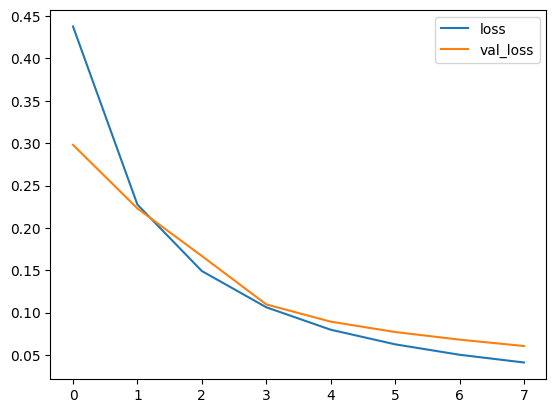

In [ ]:
losses[['loss','val_loss']].plot() #loss plotted, smooth curve

<Axes: >

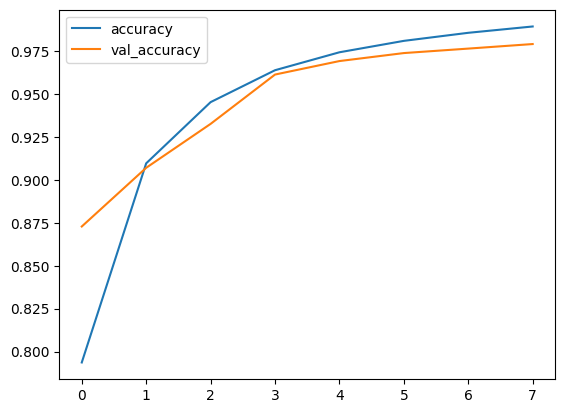

In [ ]:
losses[['accuracy','val_accuracy']].plot() #plot accuracy

In [ ]:
#predict
y_pred = model3.predict(test_set)
y_test = test_set.classes

100/100 [==============================] - 122s 937ms/step


In [ ]:
#Batch normalization metrics below

In [ ]:
print("ROC-AUC Score:", metrics.roc_auc_score(y_test, y_pred))
print("AP Score:", metrics.average_precision_score(y_test, y_pred))

ROC-AUC Score: 0.9978800600000001
AP Score: 0.9979145806359444


In [ ]:
print(metrics.classification_report(y_test, y_pred > 0.5))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10000
           1       0.98      0.98      0.98     10000

    accuracy                           0.98     20000
   macro avg       0.98      0.98      0.98     20000
weighted avg       0.98      0.98      0.98     20000



In [ ]:
from keras.models import load_model
model3 = load_model('Real_VS_Fake_VGG_final.h5')

In [ ]:
y_pred = model3.predict(test_set)
y_test = test_set.classes

100/100 [==============================] - 113s 868ms/step


In [ ]:
from sklearn.metrics import roc_curve
y_pred = y_pred.ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred)

In [ ]:
from sklearn.metrics import auc
auc = auc(fpr, tpr)

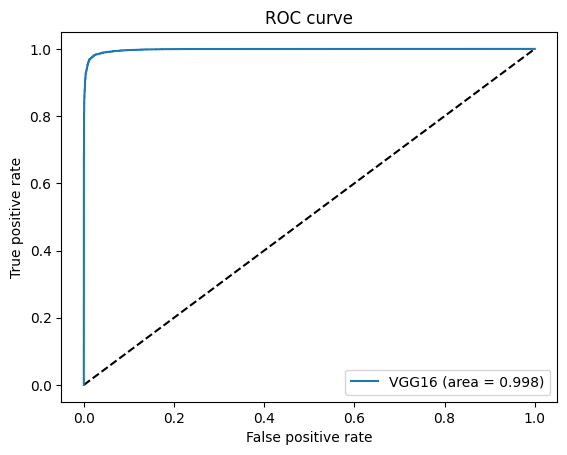

In [ ]:
#Plotting back normalization ROC curve
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='VGG16 (area = {:.3f})'.format(auc))

plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

In [ ]:
mat = metrics.confusion_matrix(y_test, y_pred > 0.5)

In [ ]:
print(mat)

[[9804  196]
 [ 234 9766]]


<Axes: >

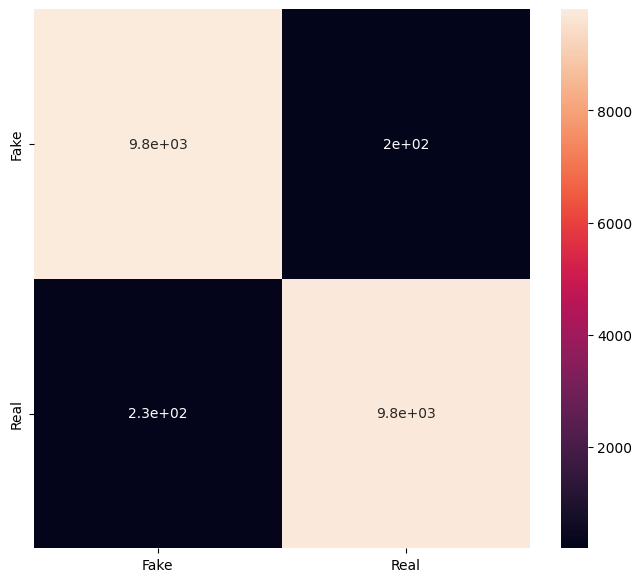

In [ ]:
#Batch normalization VGG confusion matrix
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(mat, index = ['Fake','Real'],
                  columns = ['Fake','Real'])
plt.figure(figsize = (8,7))
sn.heatmap(df, annot=True)

In [ ]:
from sklearn.metrics import roc_aus_score
from sklearn.metrics import roc_curve

FPR, TPR, thresholds = roc_curve(y_pred)

In [ ]:
#

**The next steps will demonstrate VGG16 + BackNormalization analysis**

In [ ]:
print(y_test) #print test results from the successful run

[0 0 0 ... 1 1 1]


In [ ]:
#compiling all predictions into a single list
res3 = []
for i in y_pred:
  res3.append(i[0])

In [ ]:
print(res3) #print all predictions

[0.0091533605, 0.93534386, 0.0024182217, 9.476486e-05, 5.0655353e-06, 0.011439797, 0.0074352208, 0.16829376, 8.818466e-06, 0.0048083123, 1.6083294e-06, 0.0013015951, 3.3295826e-05, 0.00028546923, 0.0009398826, 0.032741766, 0.24339543, 0.004201755, 0.0002528365, 0.3174262, 3.4791028e-05, 0.009621013, 0.002331362, 0.006005636, 0.0037985314, 0.009301744, 0.03258617, 0.00012164752, 2.1715987e-05, 0.0046552513, 0.00044939574, 3.7040183e-05, 0.0006029659, 0.021236612, 9.1880705e-05, 0.012877512, 0.001904876, 0.19313046, 0.035523716, 0.13062449, 0.38455978, 0.014462865, 0.0030093917, 0.003209897, 0.07058094, 3.091373e-05, 1.1089041e-05, 0.0003458643, 0.006954615, 0.0004822525, 0.0014306415, 3.057148e-05, 0.0054671173, 0.008954917, 0.005586189, 0.022127982, 0.0001357875, 0.0031915382, 0.00019437469, 0.008828191, 0.80208737, 0.004764398, 0.025344824, 0.00086264766, 8.2842445e-05, 0.035673104, 0.00016070326, 0.00032656806, 0.000719035, 0.01547566, 4.0606425e-05, 0.003229418, 0.015926855, 8.79490

In [ ]:
result = np.absolute(y_test-res3) #find difference

In [ ]:
print(result>.5) #array says if the image is misscalssified or not (True if it is)

[False  True False ... False False False]


In [ ]:
#Lists ONLY missclassified images
ind = []
for i in range(0,len(result)):
  if result[i] > .5:
    ind.append(i)

In [ ]:
print(ind) #indexes of missclassified images

[1, 60, 80, 87, 118, 131, 133, 154, 252, 422, 429, 446, 449, 587, 589, 648, 670, 725, 815, 819, 826, 854, 895, 941, 975, 987, 1025, 1055, 1188, 1198, 1218, 1280, 1350, 1480, 1494, 1563, 1629, 1630, 1655, 1670, 1685, 1701, 1718, 1725, 1788, 1870, 1873, 1928, 1941, 2007, 2061, 2102, 2286, 2291, 2292, 2361, 2398, 2443, 2480, 2545, 2564, 2576, 2706, 2708, 2721, 2737, 2746, 2761, 2803, 2812, 2830, 2906, 2932, 2963, 2967, 2969, 3127, 3187, 3260, 3281, 3358, 3384, 3400, 3452, 3488, 3768, 3778, 3801, 3923, 3937, 4129, 4137, 4263, 4288, 4304, 4323, 4330, 4368, 4380, 4385, 4402, 4439, 4574, 4631, 4690, 4747, 4757, 4819, 4826, 4994, 5001, 5021, 5053, 5186, 5285, 5344, 5352, 5414, 5509, 5546, 5700, 5710, 5729, 5737, 5843, 5914, 5932, 6012, 6019, 6076, 6081, 6107, 6200, 6275, 6323, 6397, 6417, 6478, 6494, 6598, 6637, 6717, 6754, 6831, 6873, 6923, 6950, 6955, 6956, 7088, 7120, 7157, 7270, 7279, 7305, 7600, 7713, 7836, 7868, 7873, 7883, 7910, 7985, 8020, 8039, 8147, 8337, 8416, 8490, 8596, 8741, 8769

In [ ]:
print(len(ind)) #total missclassified images

430


In [ ]:
print(result)

[9.15336050e-03 9.35343862e-01 2.41822167e-03 ... 2.62273490e-01
 6.95824623e-04 4.46146727e-03]


In [ ]:
from skimage.io import imread, imshow

In [ ]:
t = dataset[dataset["where"] == 'test'] #focus on test data only

In [ ]:
t.head

<bound method NDFrame.head of                                                image_path img_status where
120000  /content/real_vs_fake/real-vs-fake/test/fake/E...       fake  test
120001  /content/real_vs_fake/real-vs-fake/test/fake/D...       fake  test
120002  /content/real_vs_fake/real-vs-fake/test/fake/Q...       fake  test
120003  /content/real_vs_fake/real-vs-fake/test/fake/5...       fake  test
120004  /content/real_vs_fake/real-vs-fake/test/fake/O...       fake  test
...                                                   ...        ...   ...
139995  /content/real_vs_fake/real-vs-fake/test/real/2...       real  test
139996  /content/real_vs_fake/real-vs-fake/test/real/1...       real  test
139997  /content/real_vs_fake/real-vs-fake/test/real/6...       real  test
139998  /content/real_vs_fake/real-vs-fake/test/real/0...       real  test
139999  /content/real_vs_fake/real-vs-fake/test/real/6...       real  test

[20000 rows x 3 columns]>

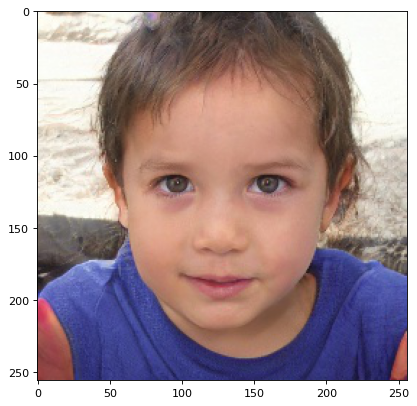

In [ ]:
#missclassified as real
image = imread(t.iloc[1]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

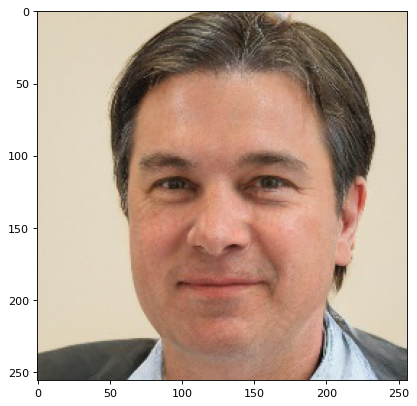

In [ ]:
#fake, classified correctly

image = imread(t.iloc[0]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

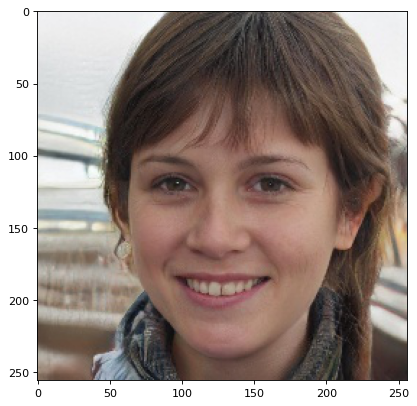

In [ ]:
#fake, classified correctly
image = imread(t.iloc[2]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

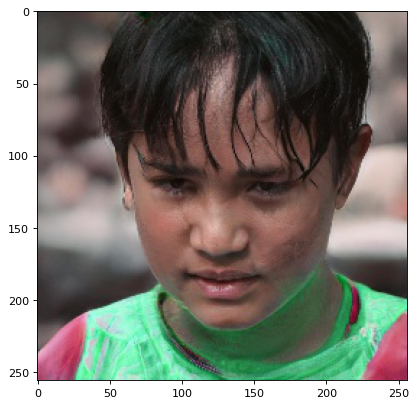

In [ ]:
#fake, classified incorrectly
image = imread(t.iloc[60]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

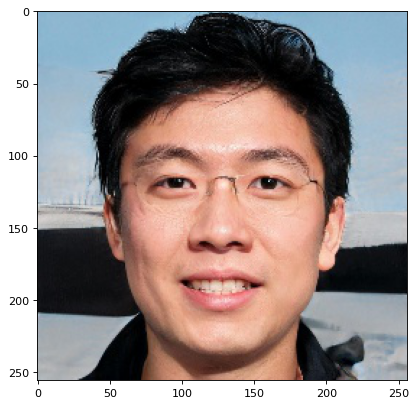

In [ ]:
#fake, classified incorrectly
image = imread(t.iloc[80]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

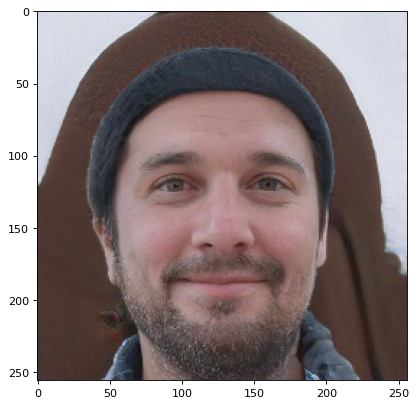

In [ ]:
#fake, classified correctly
image = imread(t.iloc[61]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

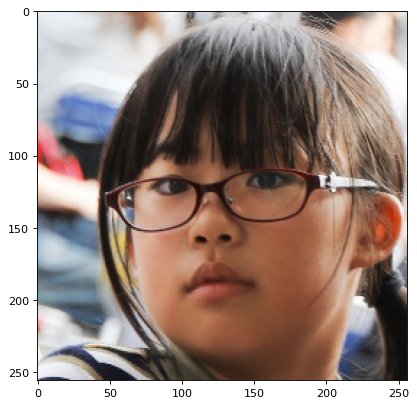

In [ ]:
#real, classified incorrectly
image = imread(t.iloc[19920]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

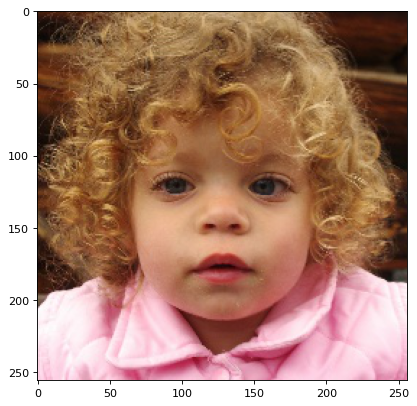

In [ ]:
#real, classified incorrectly
image = imread(t.iloc[11117]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

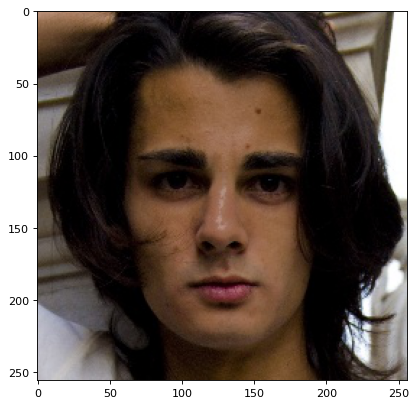

In [ ]:
#real, classified correctly
image = imread(t.iloc[19780]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

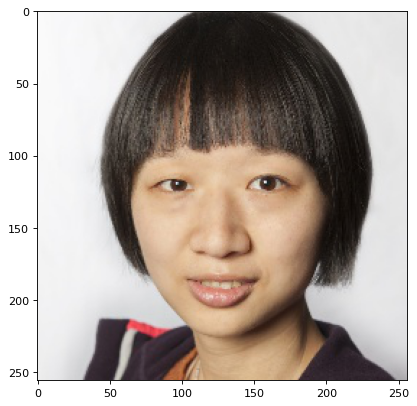

In [ ]:
#real, classified incorrectly
image = imread(t.iloc[19732]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

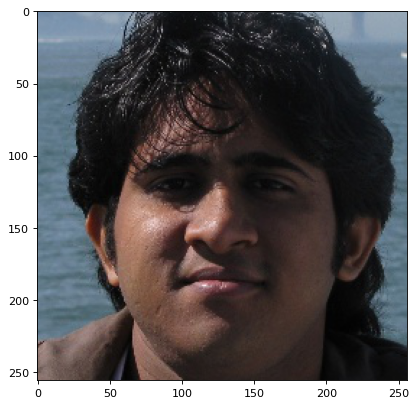

In [ ]:
#real, classified correctly
image = imread(t.iloc[19999]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

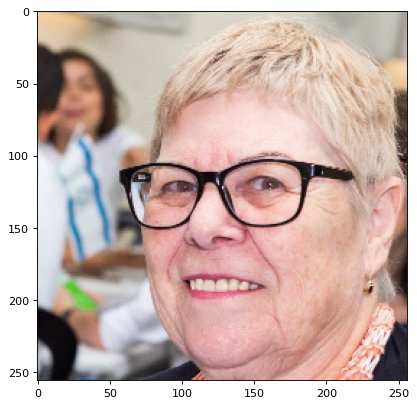

In [ ]:
#real, classified correctly
image = imread(t.iloc[10000]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

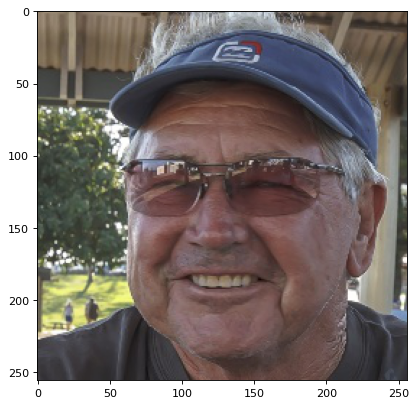

In [ ]:
#real, classified correctly
image = imread(t.iloc[10002]['image_path'])
plt.figure(num=None, figsize=(8, 6), dpi=80)
plt.imshow(image);

In [ ]:
img_test1 = t.iloc[61]['image_path']#obtain image path

In [ ]:
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
from numpy import expand_dims

In [ ]:
model3.layers[0].layers[2].output

<KerasTensor: shape=(None, 224, 224, 64) dtype=float32 (created by layer 'block1_conv2')>

In [ ]:
#https://towardsdatascience.com/extract-features-visualize-filters-and-feature-maps-in-vgg16-and-vgg19-cnn-models-d2da6333edd0

#the following method extracts feature maps from image classification
def feature_map(path, model3):
  ixs = [2,5,9,13,17] #identify layers to observe
  
  vgg = model3.layers[0] #extract vgg layers
  outputs = [vgg.layers[i].output for i in ixs]
  model = Model(inputs=vgg.inputs, outputs = outputs)
  
  #preprocess image for the model
  img = load_img(path, target_size=(224,224))
  img = img_to_array(img)
  img = expand_dims(img, axis=0)
  img = preprocess_input(img)

  feature_maps = model.predict(img) #run the model

  

  square = 8
  #plot the feature maps
  for fmap in feature_maps:
    ix = 1
    for _ in range(square):
      for _ in range(square):
        ax = plt.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        plt.imshow(fmap[0,:, :, ix-1], cmap='viridis')
        ix += 1

    plt.show()


  #flattened
  model2 = Model(inputs=model3.inputs, outputs= model3.layers[1].output)
  feature_maps2 = model2.predict(img)

  
  flat = pd.DataFrame({'Features':feature_maps2[0]})
  
  #plot bar graph of flattened features and their values
  flat.plot.barh()
  plt.show()

  model_b = Model(inputs=model3.inputs, outputs= model3.layers[2].output) #obtain output post bach-normalization
  feature_maps_b = model_b.predict(img)

  
  bn = pd.DataFrame({'Features':feature_maps_b[0]})
  
  #plot features and values post batch normalization
  bn.plot.barh()
  plt.show()

  model_f = Model(inputs=model3.inputs, outputs= model3.layers[3].output)
  feature_maps_f = model_f.predict(img)
  print(feature_maps_f)




1/1 [==============================] - 0s 178ms/step


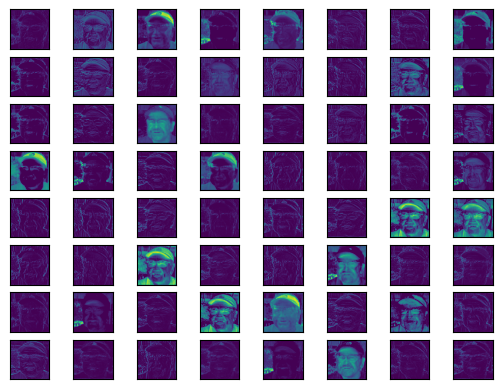

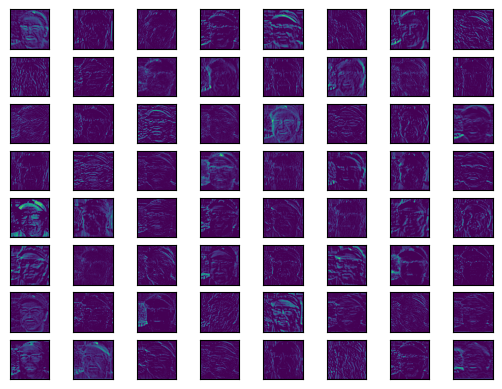

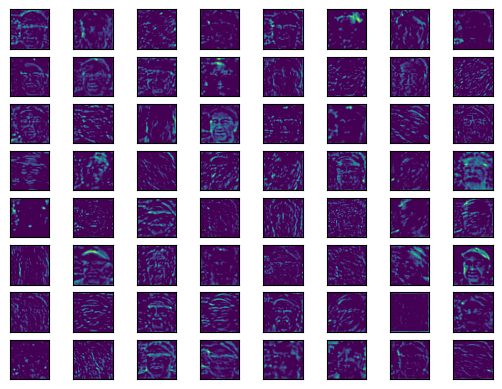

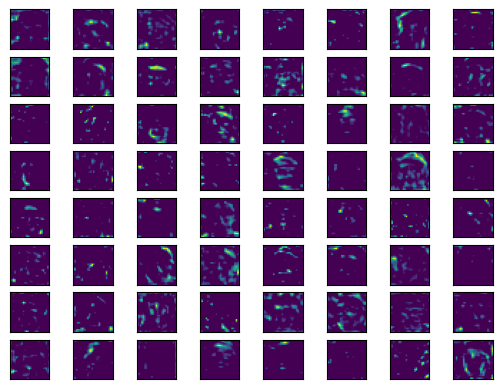

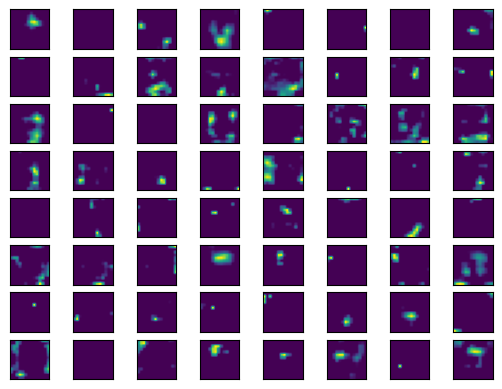

1/1 [==============================] - 0s 152ms/step


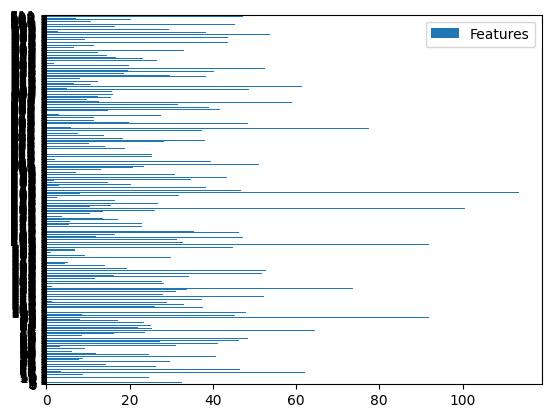

1/1 [==============================] - 0s 162ms/step


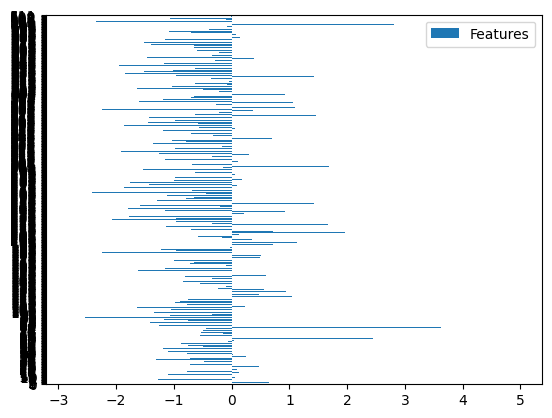

1/1 [==============================] - 0s 164ms/step
[[0.99930656]]


In [ ]:
#example: real classified as real
feature_map(img_test1, model3) 

1/1 [==============================] - 0s 150ms/step


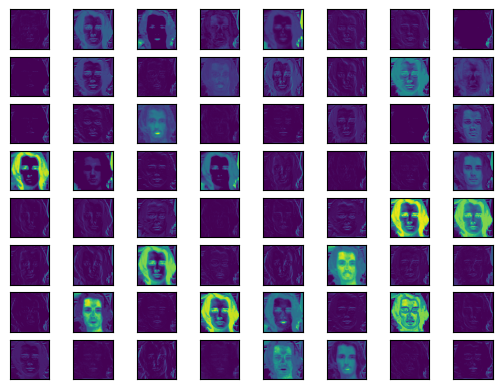

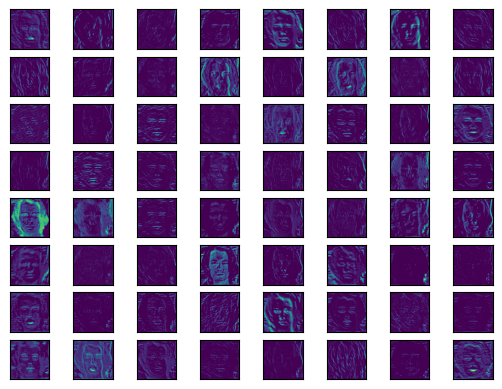

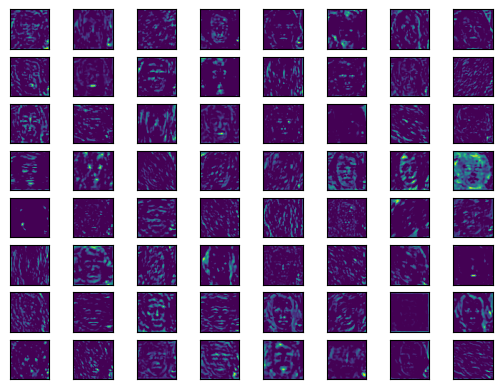

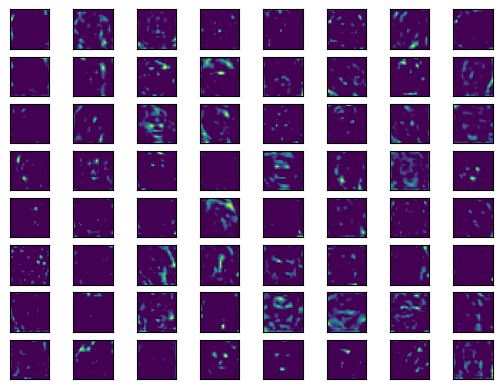

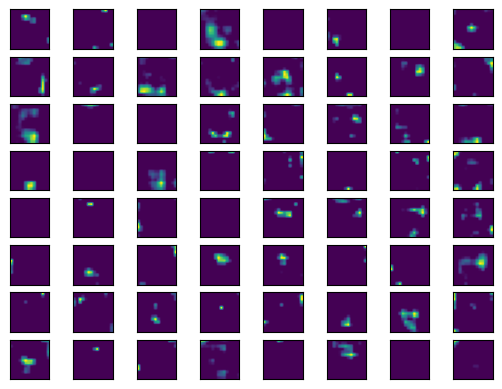

1/1 [==============================] - 0s 156ms/step


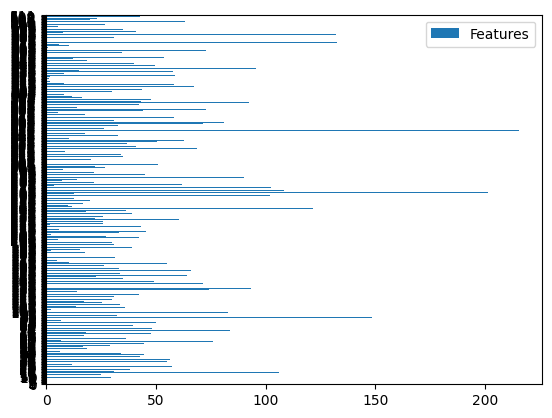

1/1 [==============================] - 0s 165ms/step


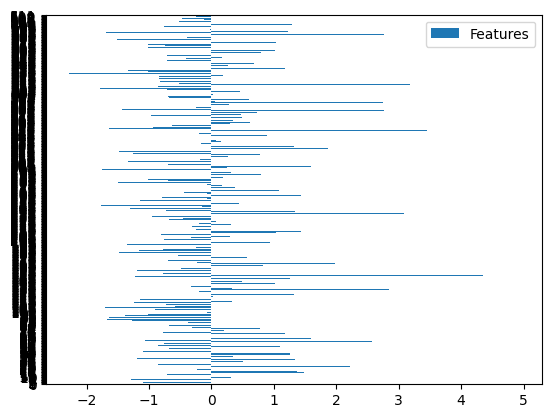

1/1 [==============================] - 0s 273ms/step
[[0.9999889]]


In [ ]:
feature_map(t.iloc[19780]['image_path'], model3) #real, classified real now, fake in one of the runs

1/1 [==============================] - 0s 148ms/step


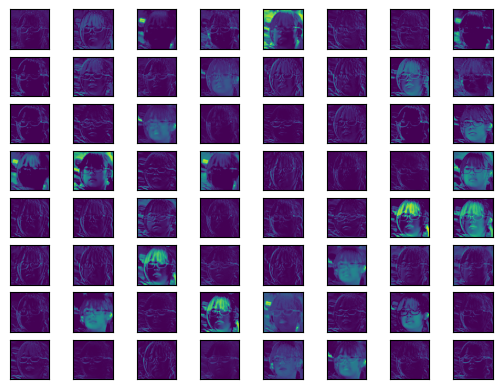

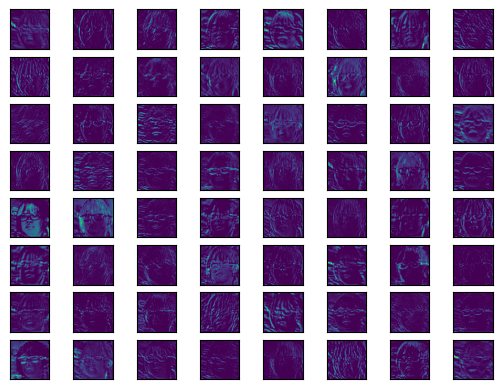

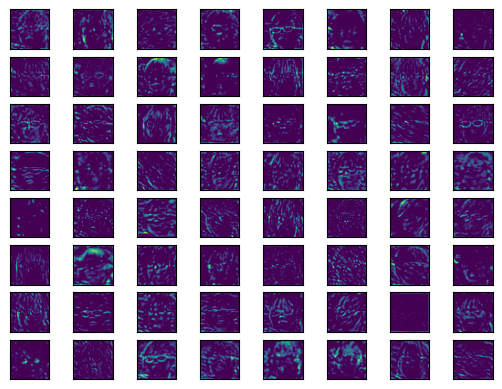

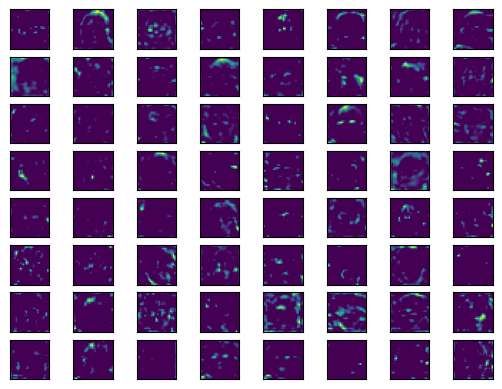

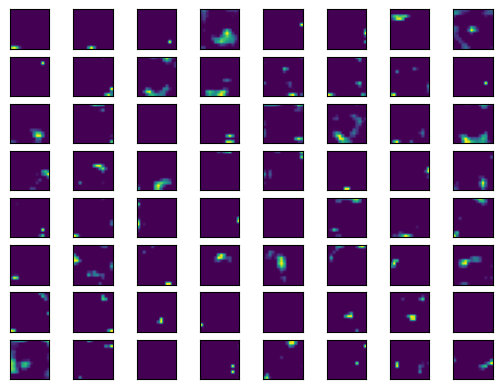

1/1 [==============================] - 0s 162ms/step


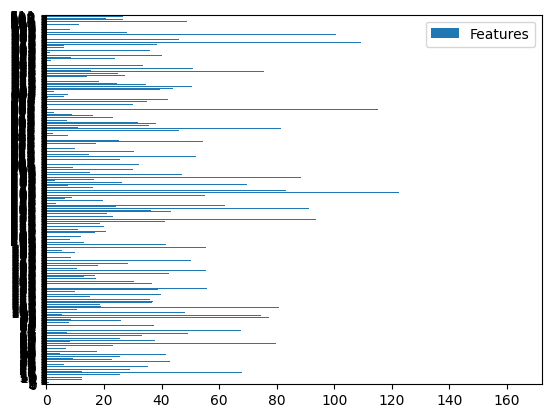

1/1 [==============================] - 0s 243ms/step


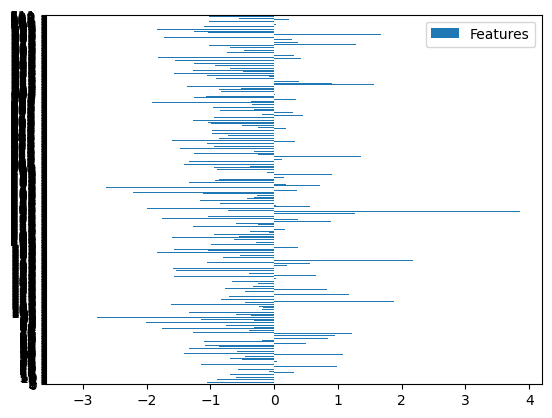

1/1 [==============================] - 0s 173ms/step
[[0.49412918]]


In [ ]:
feature_map(t.iloc[19920]['image_path'], model3) #real classified fake

1/1 [==============================] - 0s 155ms/step


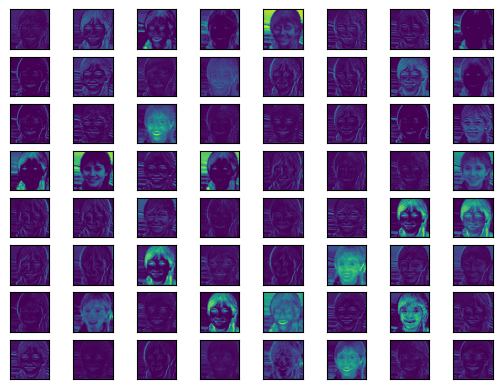

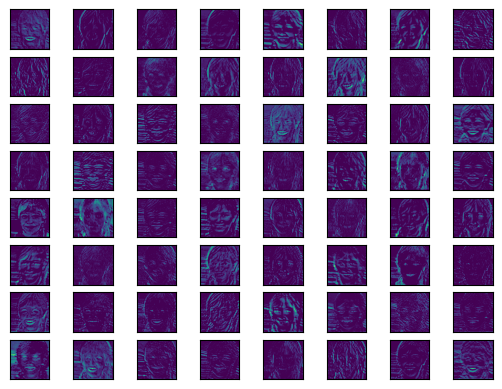

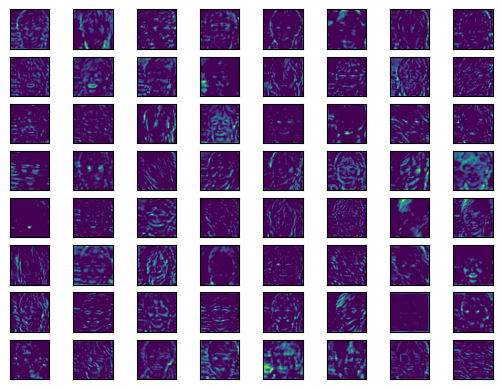

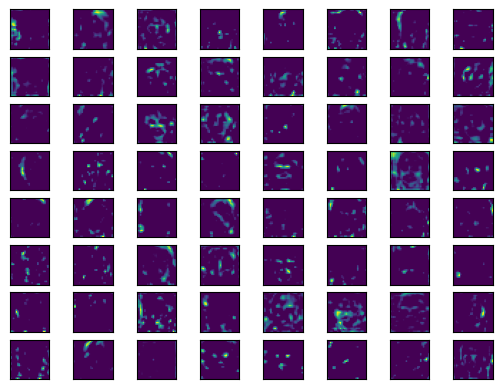

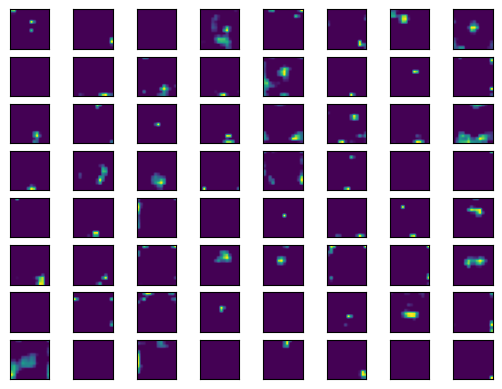

1/1 [==============================] - 0s 149ms/step


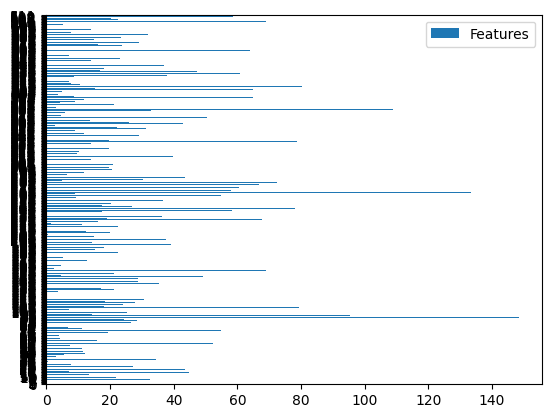

1/1 [==============================] - 0s 253ms/step


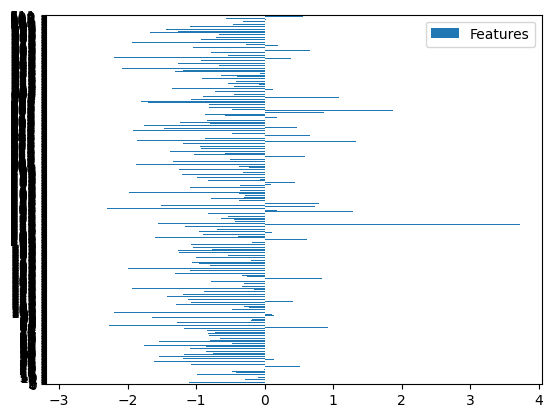

1/1 [==============================] - 0s 172ms/step
[[0.01691188]]


In [ ]:
feature_map(t.iloc[2]['image_path'], model3) #fake classified fake

1/1 [==============================] - 0s 168ms/step


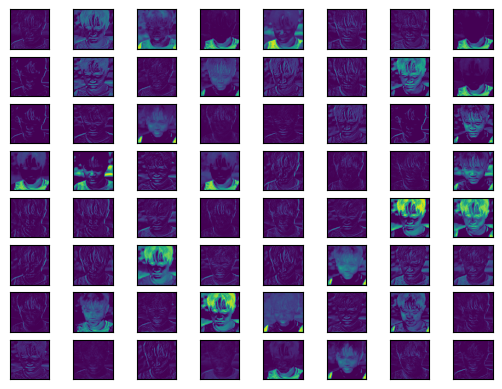

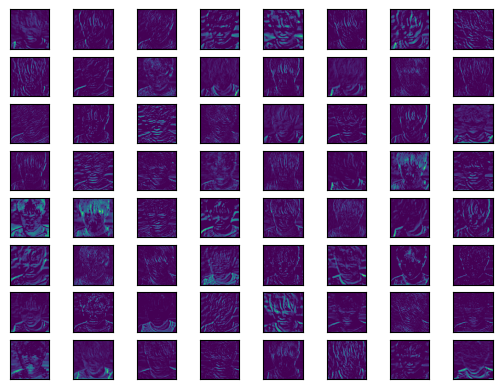

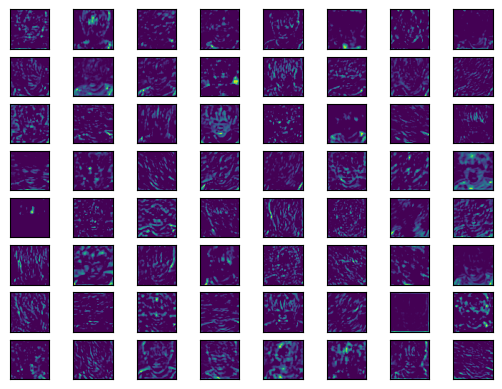

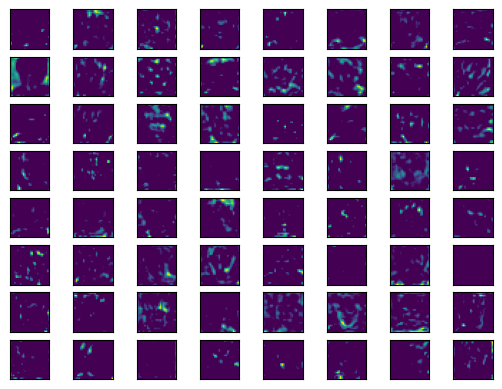

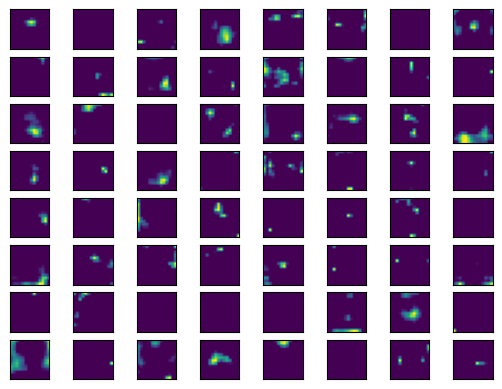

1/1 [==============================] - 0s 164ms/step


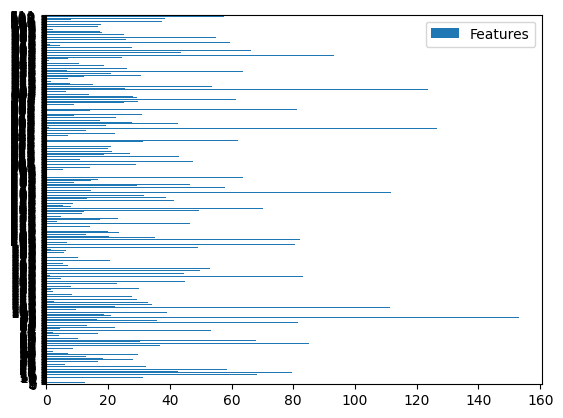

1/1 [==============================] - 0s 168ms/step


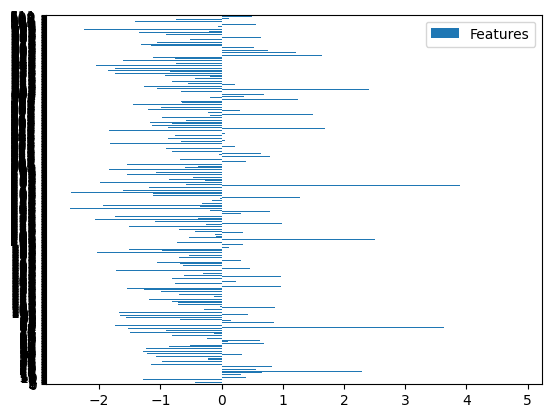

1/1 [==============================] - 0s 251ms/step
[[0.5973285]]


In [ ]:
feature_map(t.iloc[60]['image_path'], model3)#fake classified real

1/1 [==============================] - 0s 150ms/step


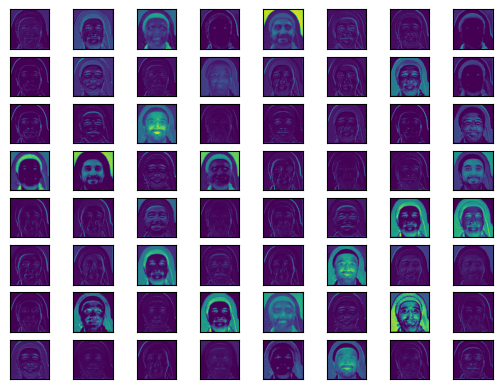

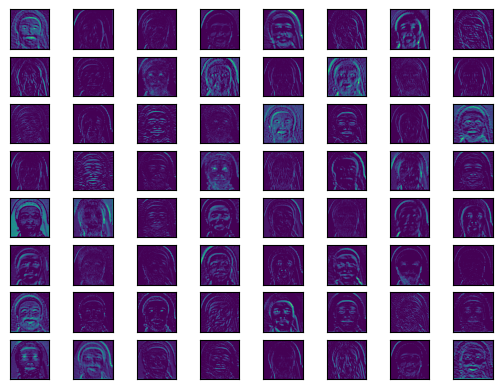

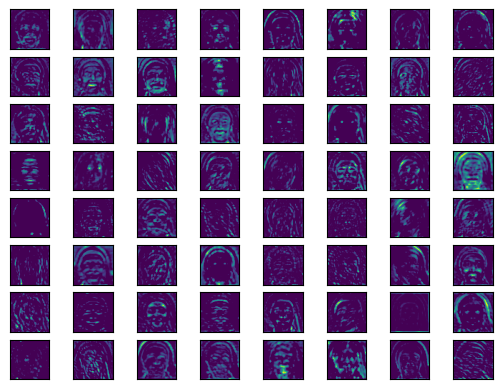

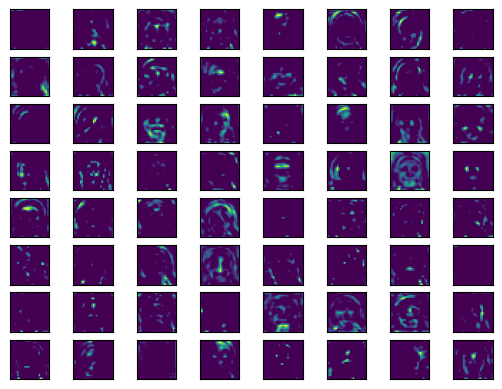

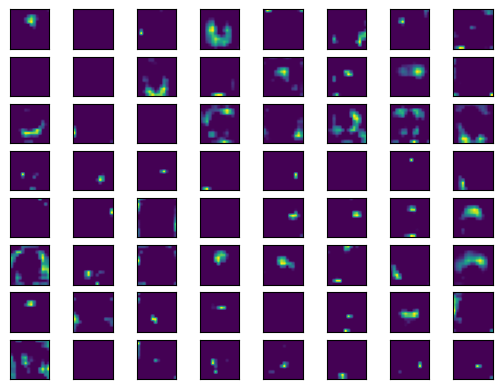

1/1 [==============================] - 0s 153ms/step


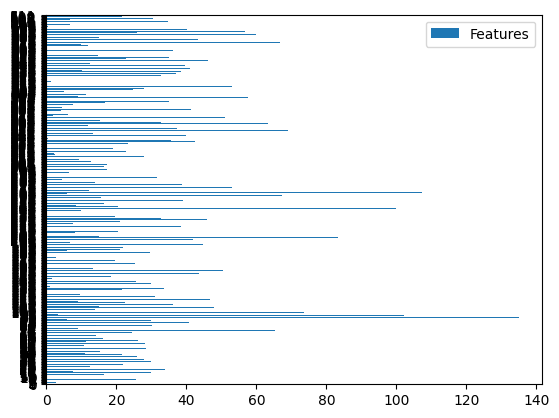

1/1 [==============================] - 0s 250ms/step


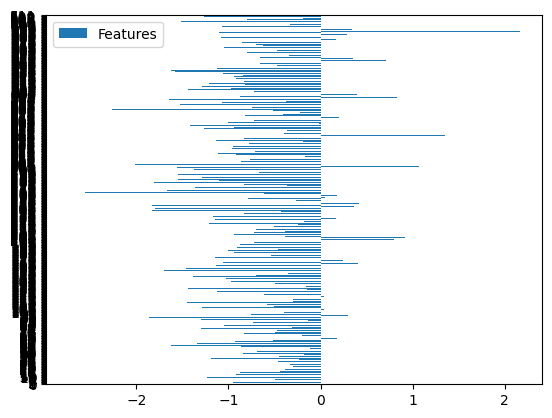

1/1 [==============================] - 0s 165ms/step
[[0.04787548]]


In [ ]:
feature_map(t.iloc[61]['image_path'], model3) #fake class fake

1/1 [==============================] - 0s 148ms/step


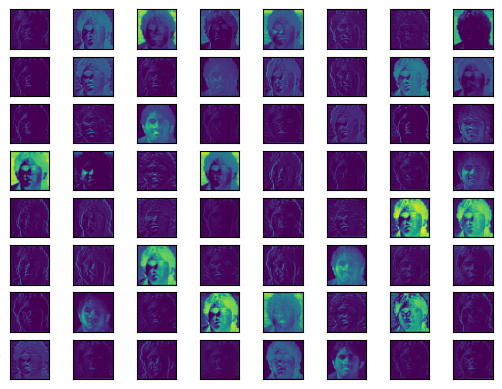

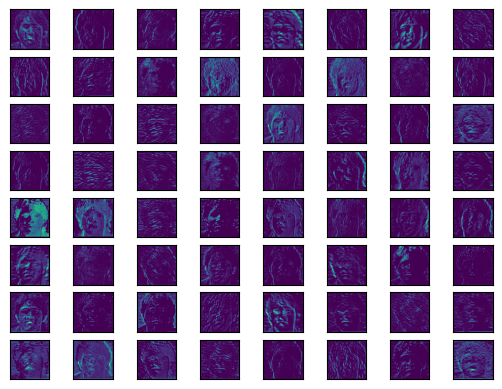

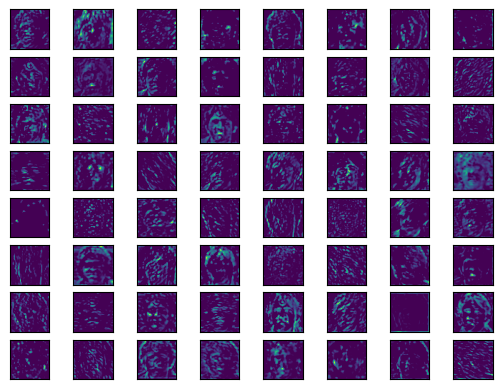

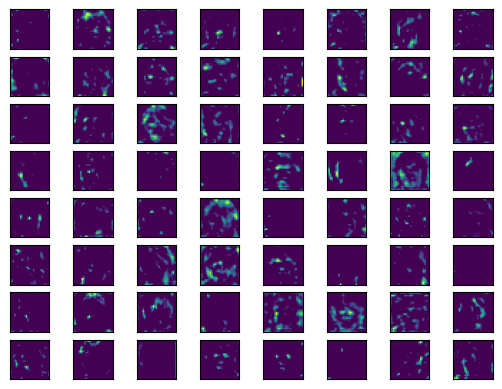

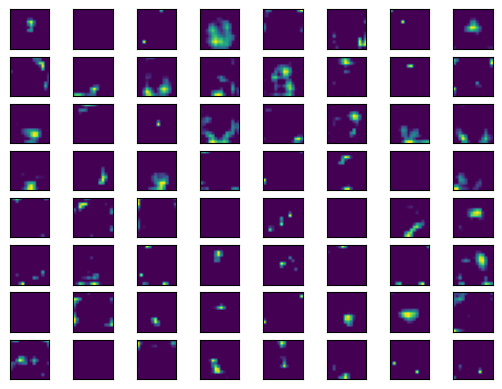

1/1 [==============================] - 0s 153ms/step


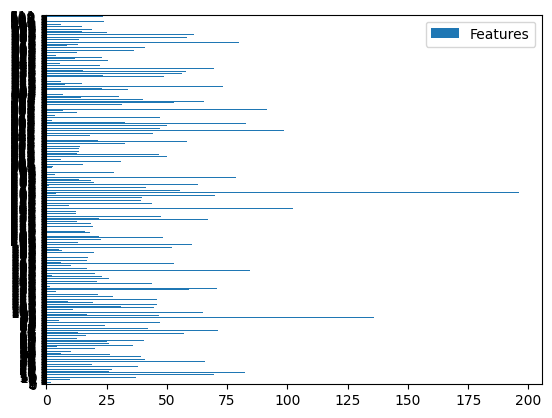

1/1 [==============================] - 0s 159ms/step


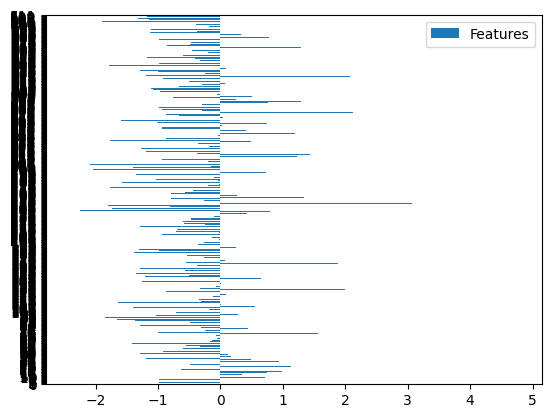

In [ ]:
feature_map(t.iloc[19999]['image_path'], model3) #real as real

1/1 [==============================] - 0s 160ms/step


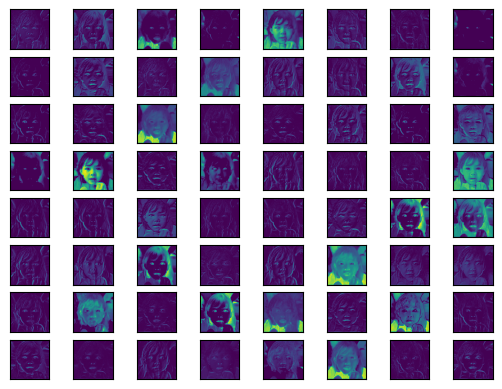

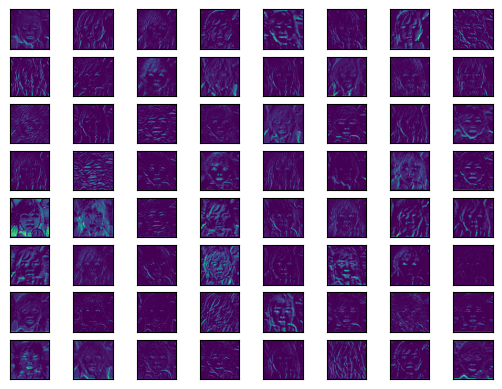

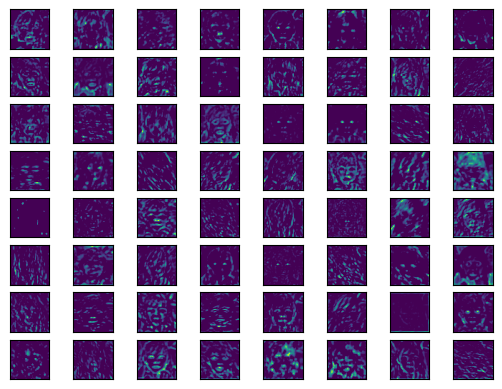

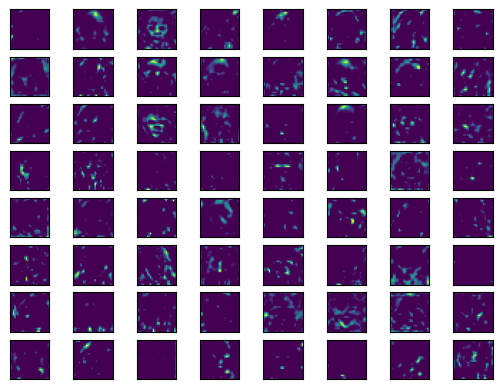

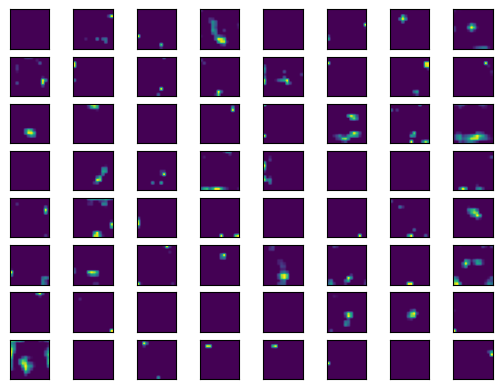

1/1 [==============================] - 0s 153ms/step


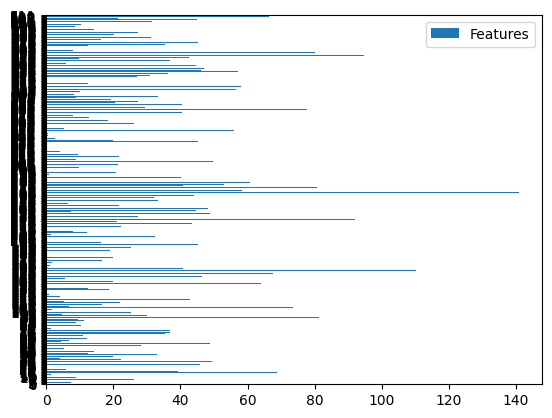

1/1 [==============================] - 0s 163ms/step


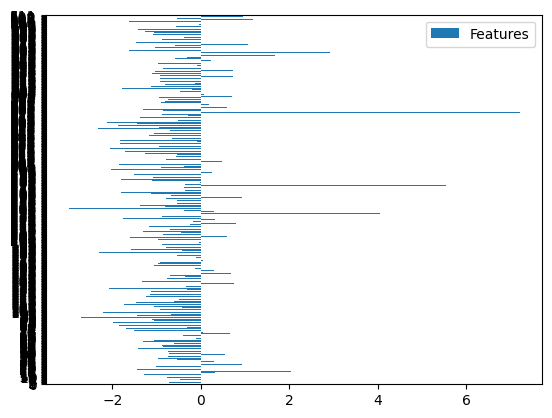

1/1 [==============================] - 0s 251ms/step
[[0.02284147]]


In [ ]:
feature_map(t.iloc[70]['image_path'], model3) #fake as fake

1/1 [==============================] - 0s 227ms/step


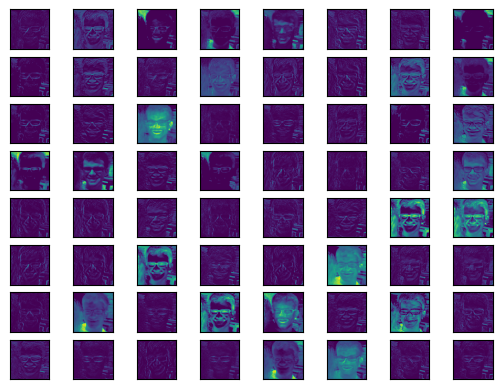

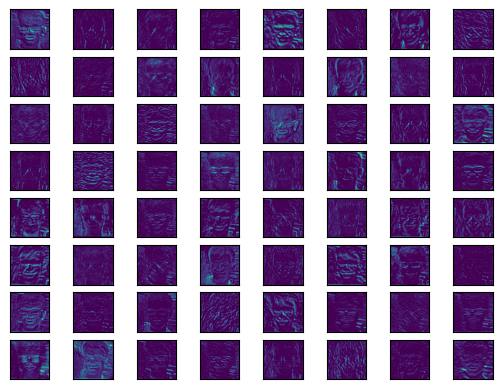

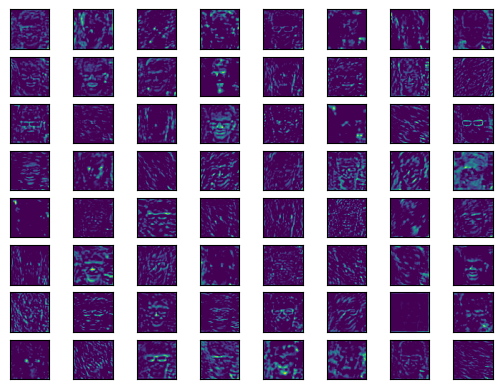

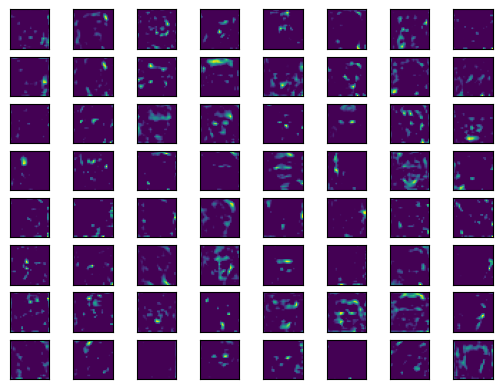

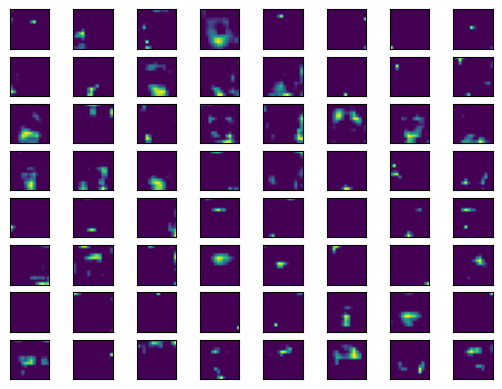

1/1 [==============================] - 0s 249ms/step


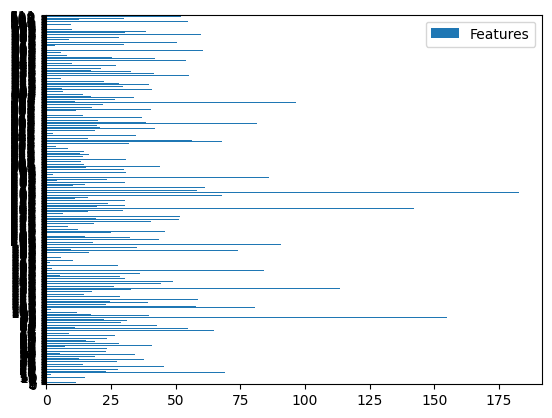

1/1 [==============================] - 0s 169ms/step


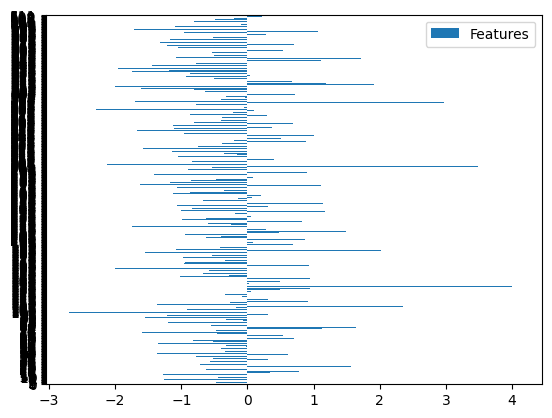

1/1 [==============================] - 0s 168ms/step
[[0.9981881]]


In [ ]:
feature_map(t.iloc[16670]['image_path'], model3) #real as real

**Below is an attempt to classify test data from a different real vs fake face dataset using the model above. As you can see, the predictions are not as good**

In [ ]:
test = [1,2,3,4,5]

In [ ]:
!unzip /content/test.zip

Archive:  /content/test.zip
   creating: test/fake/
   creating: test/real/
  inflating: test/fake/mid_179_1111.jpg  
  inflating: test/fake/mid_180_1110.jpg  
  inflating: test/fake/mid_181_0011.jpg  
  inflating: test/fake/mid_182_1111.jpg  
  inflating: test/fake/mid_183_1111.jpg  
  inflating: test/fake/mid_184_1101.jpg  
  inflating: test/fake/mid_185_1110.jpg  
 extracting: test/fake/mid_186_1100.jpg  
  inflating: test/fake/mid_187_1101.jpg  
  inflating: test/fake/mid_188_1111.jpg  
 extracting: test/fake/mid_189_0011.jpg  
  inflating: test/fake/mid_190_1111.jpg  
 extracting: test/fake/mid_191_0111.jpg  
  inflating: test/fake/mid_192_1111.jpg  
  inflating: test/fake/mid_193_1111.jpg  
  inflating: test/fake/mid_194_1111.jpg  
  inflating: test/fake/mid_195_1111.jpg  
  inflating: test/fake/mid_196_1100.jpg  
  inflating: test/fake/mid_197_1110.jpg  
  inflating: test/fake/mid_198_1111.jpg  
  inflating: test/fake/mid_199_0011.jpg  
  inflating: test/fake/mid_200_1111.jpg  


In [ ]:
nbatch = 200
img_test = ImageDataGenerator()#rescale = 1./255)

In [ ]:
test_other = img_test.flow_from_directory('/content/test/',
                                                 target_size=(224, 224),
                                                 batch_size =nbatch,
                                                 color_mode='rgb',
                                                 class_mode = 'binary',
                                                 shuffle=False)

Found 604 images belonging to 2 classes.


In [ ]:
y_pred2 = model3.predict(test_other)
y_test2 = test_other.classes

4/4 [==============================] - 10s 3s/step


In [ ]:
print(metrics.classification_report(y_test2, y_pred2 > 0.5))

              precision    recall  f1-score   support

           0       0.75      0.03      0.06       302
           1       0.51      0.99      0.67       302

    accuracy                           0.51       604
   macro avg       0.63      0.51      0.36       604
weighted avg       0.63      0.51      0.36       604



In [ ]:
mat = metrics.confusion_matrix(y_test2, y_pred2 > 0.5)

In [ ]:
print(mat)

[[  9 293]
 [  3 299]]


In [ ]:
#https://towardsdatascience.com/convolutional-neural-network-feature-map-and-filter-visualization-f75012a5a49c